# Coursework 3: Bilinear Inverse Problems and Low-Rank Matrix Recovery

[x] By tick the checkbox, we hereby declare that this coursework report is our own and autonomous work. We have acknowledged all material and sources used in its preparation, including books, articles, reports, lecture notes, internet software packages, and any other kind of document, electronic or personal communication. This work has not been submitted for any other assessment.

## 3.1 Test Data Generation (10%)

We consider the low-rank matrix completion problem given by 
$$
    \bm{y} = \mathcal{P}_{\Omega}(\bm{X}) 
$$
where $\bm{X} \in \mathbb{R}^{m \times n}$ is a low rank matrix of rank $r$. 

Data generation: Write $\bm{X} = \bm{U} \bm{G} \bm{V}^{\mathsf{T}}$, where $\bm{U} \in \mathbb{R}^{m \times r}$, $\bm{G} \in \mathbb{R}^{r \times r}$, and $\bm{V} \in \mathbb{R}^{n \times r}$ are matrices with i.i.d. $\mathcal{N}(0,1)$ Gaussian entries. (Note that by $\bm{X} = \bm{U} \bm{G} \bm{V}^{\mathsf{T}}$ we are not talking about SVD.)

Design and implement a function `LRMC_data_gen` to generate test data. Provide necessary documentation.

In [1]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

function GaussianGen(m::Int64, n::Int64)
    A = randn(Float64, m, n)
    Norm = zeros(m,n)
    for i = 1:n
        Norm[:,i] = normalize(A[:,i], 2);
    end
    return Norm
end

function Create_linear_operator(Ω)
    m, n = size(Ω)
    idm = Matrix(1I, m*n, m*n)

    cardinality = count(i->(i != false), vec(Ω))
    A = Array{Int64, 2}(undef, cardinality, m*n)

    idx = 1

    for i = 1:m*n
        if vec(Ω)[i] == true
            A[idx, :] = idm[i, :]
            idx += 1
        end
    end

    return A
end

function Observation_samples(X::AbstractArray, m::Int64, n::Int64, samples::Int64)

    random_indices = sample(randperm(m*n), samples, replace=false)

    Ω = zeros(Bool, m, n)
    Ω[random_indices] .= true

    Y = zeros(m, n)

    Y[Ω] = X[Ω]

    return Y, Ω
end

function LRMC_data_gen(m::Int64, n::Int64, r::Int64)
    U = GaussianGen(m, r)
    G = GaussianGen(r, r)
    V = GaussianGen(n, r)

    X = U * G * V'

    return X
end

LRMC_data_gen (generic function with 1 method)

## 3.2 Matrix Completion Techniques

In the following, the suggested simulation setup is that $m = 32$, $n=48$, $r$ varies in $2:2:8$, and $|\Omega|/mn$ varies in $\{1/8,~ 1/6,~ 1/4,~ 1/2\}$. 

### 3.2.1 Alternating Minimization (20%)

Design, implement, and run tests for the alternating minimization method for low-rank matrix completion. Use the function name `LRMCRec_AM`. Provide necessary documentation.

In [2]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

function Least_squares_P(Y, P, Ω)
    r = size(P, 2)
    m = size(Y, 1)
    n = size(Y, 2)
    
    Q = Array{Float64, 2}(undef, n, r)

    for i = 1:n
        y = Y[:, i]
        p = Array{Float64, 2}(undef, m, r)

        for j = 1:r
            p[:, j] = Ω[:, i] .* P[:, j] 
        end

        Q'[:, i] = pinv(p) * y
    end

    return Q
end

function Least_squares_Q(Y, Q, Ω)
    r = size(Q, 2)
    m = size(Y, 1)
    n = size(Y, 2)

    P = Array{Float64, 2}(undef, m, r)

    for i = 1:m
        y = Y'[:, i]
        q = Array{Float64, 2}(undef, n, r)

        for j = 1:r
            q[:, j] = Ω'[:, i] .* Q[:, j] 
        end

        P'[:, i] = pinv(q) * y
    end

    return P
end

function LRMCRec_AM(Y, Ω, r, iters)
    U, _, _ = svd(Y)

    P = U[:, 1:r]
    Q = Least_squares_P(Y, P, Ω)

    cost_list = []
    cost = norm(Y[Ω] - (P*Q')[Ω], 2)^2
    append!(cost_list, cost)
    
    for i = 1:iters-1
        Q = Least_squares_P(Y, P, Ω)
        P = Least_squares_Q(Y, Q, Ω)

        cost = norm(Y[Ω] - (P*Q')[Ω], 2)^2
        append!(cost_list, cost)
    end

    X = P * Q'
    return X, cost_list
end

LRMCRec_AM (generic function with 1 method)

In [3]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="AM for r=$(rank)", ylabel="cost", xlabel="iteration")

    for sample_idx = 1:length(samples)
        iters = 100

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        X_predict, cost_list = LRMCRec_AM(Y, Ω, rank, iters)
        error = norm(X_predict - X) / norm(X)

        push!(log, (rank, sample_ratio, error))

        println("Rank: ", rank, " samples: ", Ω_sample, " Error: ", error)
        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)", fmt = :png, dpi=2080)
    end
    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

Rank: 2 samples: 192 Error: 1.8065010448153895
Rank: 2 samples: 256 Error: 0.0020006863285181027
Rank: 2 samples: 384 Error: 2.8582879344159305e-12
Rank: 2 samples: 768 Error: 4.897851267574452e-16
Rank: 4 samples: 192 Error: 12.805340020014867
Rank: 4 samples: 256 Error: 14.878350690289759
Rank: 4 samples: 384 Error: 4.872529649700802
Rank: 4 samples: 768 Error: 1.3374045303171187e-15
Rank: 6 samples: 192 Error: 10.43988694868972
Rank: 6 samples: 256 Error: 42.458979535840385
Rank: 6 samples: 384 Error: 10.244337591980683
Rank: 6 samples: 768 Error: 6.813812075607344
Rank: 8 samples: 192 Error: 14.984914338435225
Rank: 8 samples: 256 Error: 2.570577278975735
Rank: 8 samples: 384 Error: 7.738364995147105
Rank: 8 samples: 768 Error: 1.805929090669472


### 3.2.2 Iterative Hard Thresholding (IHT) (20%)

Design, implement, and run simple tests for the IHT algorithm for low-rank matrix completion. Use the function name `LRMCRec_IHT`. Provide necessary documentation. 

In [4]:
function r_rank_approx(M, r::Int)
    U, Σ, V = svd(M)
    N = length(Σ)

    for i = r+1:N
        Σ[i] = 0
    end

    return U * Diagonal(Σ) * V'
end

function LRMCRec_IHT(Y, Ω, r::Int, τ::Float64, iters::Int)
    m, n = size(Y)
    X = copy(Y)
    
    temp = zeros(m,n)   
    cost_list = []
    cost = norm(Y[Ω] - X[Ω], 2)^2
    append!(cost_list, cost)

    for i = 1:iters
        # Iteration algorithm to reduce objective error 
        temp[Ω] = Y[Ω] - X[Ω]
        X = r_rank_approx(X + τ*(temp), r)
        
        #Calculate current cost
        cost = norm(Y[Ω] - X[Ω], 2)^2
        append!(cost_list, cost)

    end 
    return X, cost_list
end

LRMCRec_IHT (generic function with 1 method)

In [5]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="IHT for r=$(rank)", ylabel="final error", xlabel="τ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_τ = []
        info_error = []

        for τ = 0.01:0.1:1.0
            iters = 100
            X_predict, _ = LRMCRec_IHT(Y, Ω, rank, τ, iters)
            error = norm(X_predict - X) / norm(X)

            push!(info_τ, τ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, τ, error))
        end

        plot!(plotter, info_τ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

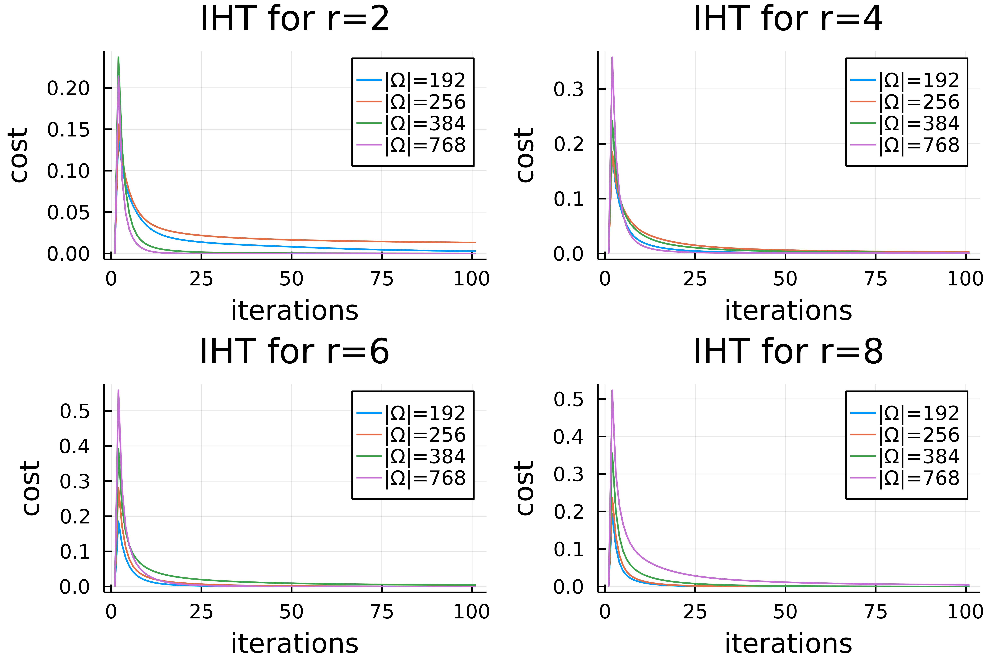

In [6]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="IHT for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        τ = 1.0
        iters = 100
        X_predict, cost_list = LRMCRec_IHT(Y, Ω, rank, τ, iters)
        error = norm(X_predict - X) / norm(X)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=1040)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

### 3.2.3 Iterative Shrinkage-Thresholding Algorithm (ISTA) (25%)

Design, implement, and run simple tests for ISTA (to solve the Lasso formulation) for low-rank matrix completion. Use the function name `LRMCRec_ISTA`. Provide necessary documentation. Use simulations to discuss the choice of parameters.

In [7]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

# Helper functions

function nuclear_norm(X)
    _, S, _ = svd(X)
    return sum(S)
end

function current_cost(X, Y, Ω, λ)
    return 0.5 * norm(X[Ω] - Y[Ω])^2 + λ * nuclear_norm(X)
end

function Singular_value_soft_threshold(X, λ)
    U, S, V = svd(X)
    threshold = max.(S .- λ, 0.0)
    return U * Diagonal(threshold) * V'
end

# Low Rank Matrix Completion Iterative Shrinkage Thresholding Algorithm.

function LRMCRec_ISTA(Y, Ω, λ, iterations)
    X = copy(Y)

    cost_list = zeros(iterations + 1)
    cost_list[1] = current_cost(X, Y, Ω, λ)

    for i=1:iterations
        X[Ω] = Y[Ω]
        X = Singular_value_soft_threshold(X, λ)

        cost_list[i+1] = current_cost(X, Y, Ω, λ)
    end

    return X, cost_list
end

LRMCRec_ISTA (generic function with 1 method)

In [8]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ISTA for r=$(rank)", ylabel="final error", xlabel="λ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_λ = []
        info_error = []

        for λ = 0.01:0.1:1.0
            iters = 100
            X_predict, cost_list = LRMCRec_ISTA(Y, Ω, λ, iters)
            error = norm(X_predict - X) / norm(X)

            push!(info_λ, λ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, λ, error))
        end

        plot!(plotter, info_λ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])


In [9]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ISTA for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        λ = 0.01
        iters = 100
        X_predict, cost_list = LRMCRec_ISTA(Y, Ω, λ, iters)
        error = norm(X_predict - X) / norm(X)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

### 3.2.4 Lasso-ADMM (25%)

Design, implement, and run simple tests for an ADMM algorithm (to solve the Lasso formulation) for low-rank matrix completion. Use the function name `LRMCRec_ADMM`. Provide necessary documentation. Compare ADMM and ISTA in terms of convergence.

Lasso formulation is written as:
$$
argmin_{x} \frac{1}{2}||y - Ax||_{2}^{2} + \lambda||x||_{1}
$$
Since ADMM algorithm will be used for low rank matrix completion, we can interpret the $Ax$ of the lasso problem as the linear mapping of the revealed entries of x (our estimation matrix) indexed by $\Omega$.

Given that the corresponding ADMM iterations are:
$$
x^{k+1} = arg min_x \frac{1}{2}||y - Ax||_{2}^{2} + \frac{\rho}{2}||x - z_{k} + \frac{v_{k}}{\rho}||_{2}^{2}
$$
$$
z^{k+1} = arg min_z \lambda ||z||_{1} + \frac{\rho}{2}||x_{k+1} - z + \frac{v_{k}}{\rho}||_{2}^{2}
$$
$$
v^{k+1} = v_{k} + \rho (x^{k+1} - z^{k+1})
$$

For $x^{k+1}$, we can calculate the closed form solutions by setting $\nabla f(x)=0$, resulting in:
$$
x = (A^{T}A + \rho)^{-1} (A^{T}y + \rho z^{k} - v^{k})
$$

Here $(A^{T}A + \rho)^{-1}$ is equal to the reciprocal of $A^{T}A + \rho$, i.e $\frac{1}{element}$, as it is a diagonal matrix. $A^{T} y = Y$ so it results in element wise division by each corresponding element in $\Omega + \rho$ where $\Omega$ is our matrix of revealed entries.
Thus, we have:
$$
x^{k+1} = (Y + \rho*(Z-V))⊙(\Omega + \rho)
$$
where ⊙ is element-wise division

To find the closed form solution of $z^{k+1}$, we first consider the solution for the ISTA algorithm. 

$$
X^{*} = arg min_{x}||X|| + \frac{1}{2\gamma}||X-Z||^{2}_{F}
$$
$$
= \Sigma_{i=1}\eta(\sigma_{i};\gamma)u_{i}v_{i}^{T} 
$$
where $\eta$ is the soft thresholding function.
Comparing this to the iterations of $z^{k+1}$, we see that it is of similar form and thus can compose:
$$
z^{k+1} = \eta(X+V; \frac{\lambda}{\rho})
$$


In [10]:
# https://web.stanford.edu/~boyd/papers/pdf/admm_distr_stats.pdf

# Helper functions

function Singular_value_soft_threshold(X, λ)
    """
    Generates a matrix defined by its svd where the diagonal 
    matrix is determined by a threshold

    :param X: Matrix64
        Matrix in question
    :param λ: Float64
        Threshold value determined by the constants
    """
    U, S, V = svd(X)
    threshold = max.(S .- λ, 0.0)
    return U * Diagonal(threshold) * V'
end


function nuclear_norm(X)
    """
    Calculates the L1/Nuclear norm of a matrix

    :param X: Matrix64
    """
    _, S, _ = svd(X)
    return sum(S)
end


function current_cost(X, Y, Ω, λ)
    """
    Calculates the lasso formulation

    :param X: Matrix64
        our estimated matrix that we find by iterating
    :param Y: Matrix64
        the groundtruth masked matrix
    :param Ω: Array64
        vector of revealed indices. determines cardinality
    :param λ: Float64
        tuning parameter for the lasso problem
    """
    return 0.5 * norm(X[Ω] - Y[Ω])^2 + λ * nuclear_norm(X)
end

function LRMCRec_ADMM(Y, Ω, λ, ρ, iters, error_diff_tresh)
    """
    Solve the lasso problem for low rank matrix completion with the ADMM algorithm

    :param Y: Matrix64
        original masked matrix
    :param Ω: Array64
        vector of revealed indices. determines cardinality
    :param λ: Float64
        Threshold value determined by the constants
    :param ρ: Float64
        Constant needed for the lagrangian multiplication
    :param iters: Int64
        Maximum number of iterations for the algorithm before breaking
    :param error_diff_tresh: Float64
        Threshold comparing the current loss and previous loss to determine whether a significant update has been made
    """
    X = copy(Y)
    m, n = size(X)
    
    Z = zeros(Float64, m, n)
    V = zeros(Float64, m, n)

    cost_past = Inf
    cost = current_cost(X, Y, Ω, λ)
    counter = 0
    cost_list = []
    push!(cost_list, cost)
    
    while counter <= iters
        X = (Y + ρ*(Z - V)) ./ (Ω .+ ρ)
        Z = Singular_value_soft_threshold(X+V, λ/ρ)
        V += X
        V -= Z

        cost = current_cost(X, Y, Ω, λ)
        push!(cost_list, cost)
        counter += 1

        if (cost_past - cost <= error_diff_tresh)
            break
        else
            cost_past = cost
        end
    end

    return X, counter, cost_list
end

LRMCRec_ADMM (generic function with 1 method)

In [11]:
#Testing lambda vs Final Error

using Plots
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="final error", xlabel="λ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_λ = []
        info_error = []

        for λ = 0.01:0.01:0.25
            iters = 100
            ρ = 0.5
            error_diff_thresh = 0.00001
            X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, ρ, iters, error_diff_thresh)
            error = norm(X_predict - X) / norm(X)

            push!(info_λ, λ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, λ, error))
        end

        plot!(plotter, info_λ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

When comparing the error versus $\lambda$, the plots reveal the minimum error occurs approximately around and before 0.05 across the various ranks. We use this as a guideline to determine our $\lambda$ value.

In [12]:
#Testing error vs rho

m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="final error", xlabel="ρ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_ρ = []
        info_error = []

        for ρ = 0.01:0.01:1
            iters = 100
            λ = 0.025
            error_diff_thresh = 0.00001
            X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, ρ, iters, error_diff_thresh)
            error = norm(X_predict - X) / norm(X)

            push!(info_ρ, ρ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, ρ, error))
        end

        plot!(plotter, info_ρ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

Comparing the final error to $\rho$, the plots reveal that there is no definite relationship between the two variables as the final error is approximately uniform, independent of $\rho$. $\rho$ is an arbitrary penalty constant, which is as expected.

In [13]:
#Testing performance of the ADMM algorithm
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        λ = 0.025
        ρ = 1
        error_diff_thresh = 0.00001
        iters = 100
        X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, ρ, iters, error_diff_thresh)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
        ln = length(cost_list)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

The ADMM algorithm performs a sharp convergence for all of the various ranks and omega values. For each rank and omega, the cost approximately converges in less than 25 iterations. 

Comparedd to the performance to the ISTA algorithm, the ADMM demonstrates superior performance with a quicker convergence across all ranks and cardinalities. For example, at rank = 8 and cardinality = 768, the ADMM algorithm converges at approximately 50 iterations. The ISTA algorithm converges at approximately 100 iterations.

Compared to the ISTA algorithm, the ADMM demonstrates a sharper, or quicker, convergence, most likely due to the dual ascent approach stemming from the Lagrangian multipliers, not found in the ISTA algorithm.

## Highlight

Please list a couple of highlights of your coursework that may impress your markers.